# (논문) STUDY
> Cat/Dog_Randombox와 hierarchical CAM

- toc:true
- branch: master
- badges: true
- comments: true
- author: 김하영
- categories: [Study]

---

### import 

In [2]:
import torch 
from fastai.vision.all import *
import cv2

In [3]:
import numpy as np

In [4]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageFile
from PIL import Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [6]:
from torchvision.utils import save_image
import os

---

### Simulation

In [7]:
def label_func(f):
    if f[0].isupper():
        return 'cat' 
    else: 
        return 'dog' 

### - 여기서는 `랜덤박스가 추가된 개/고양이 그림`에 대해 CAM을 진행한 결과를 확인함

#### (1) 랜덤박스가 들어간 개 고양이 그림 

In [8]:
path=Path('1103_pet')   #랜덤박스넣은사진

In [9]:
path.ls()

(#7391) [Path('1103_pet/boxer_128.jpg'),Path('1103_pet/Sphynx_142.jpg'),Path('1103_pet/British_Shorthair_203.jpg'),Path('1103_pet/Ragdoll_142.jpg'),Path('1103_pet/Persian_272.jpg'),Path('1103_pet/Bombay_200.jpg'),Path('1103_pet/shiba_inu_103.jpg'),Path('1103_pet/chihuahua_142.jpg'),Path('1103_pet/scottish_terrier_156.jpg'),Path('1103_pet/basset_hound_163.jpg')...]

In [10]:
files=get_image_files(path)

In [11]:
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

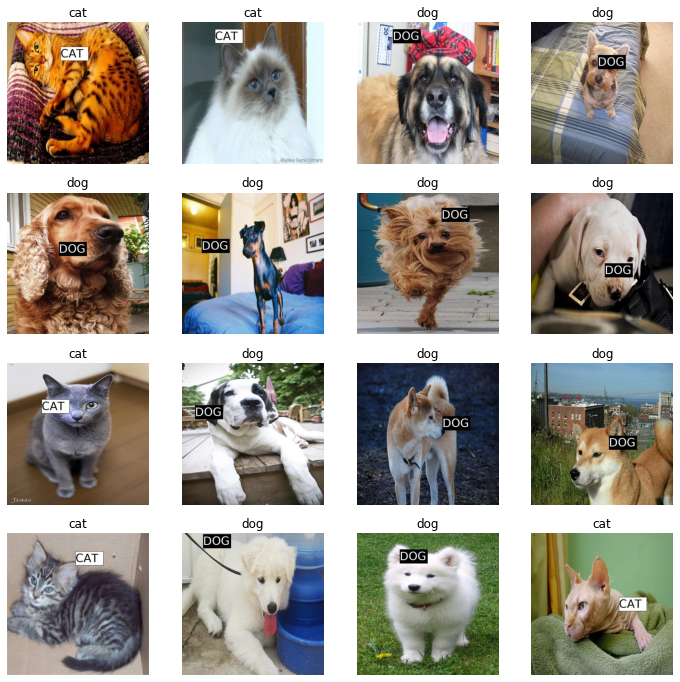

In [12]:
dls.show_batch(max_n=16)

#### (2) 학습 

In [13]:
lrnr=cnn_learner(dls,resnet34,metrics=error_rate)
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.153054,0.010450,0.004736,00:37


epoch,train_loss,valid_loss,error_rate,time
0,0.002741,0.000014,0.000000,00:44


In [14]:
net1=lrnr.model[0]
net2=lrnr.model[1] 

In [15]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [16]:
net=torch.nn.Sequential(net1,net2)

In [17]:
lrnr2=Learner(dls,net,metrics=accuracy) 

In [18]:
lrnr2.fine_tune(10) 

epoch,train_loss,valid_loss,accuracy,time
0,0.007910,0.000233,1.000000,00:43


epoch,train_loss,valid_loss,accuracy,time
0,0.000018,0.000005,1.000000,00:43
1,0.000004,0.000001,1.000000,00:43
2,0.000001,0.000000,1.000000,00:43
3,0.000000,0.000000,1.000000,00:43
4,0.000000,0.000000,1.000000,00:43
5,0.000000,0.000000,1.000000,01:48
6,0.000000,0.000000,1.000000,00:43
7,0.000000,0.000000,1.000000,00:43
8,0.000000,0.000000,1.000000,00:43
9,0.000000,0.000000,1.000000,00:43


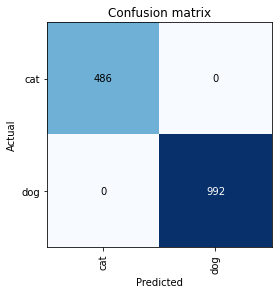

In [19]:
interp = ClassificationInterpretation.from_learner(lrnr2)
interp.plot_confusion_matrix()

#### (3) CAM 결과

In [20]:
x, = first(dls.test_dl([PILImage.create(get_image_files(path)[7389])]))

In [21]:
camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())

In [22]:
x.shape

torch.Size([1, 3, 512, 512])

In [23]:
camimg.shape

torch.Size([2, 16, 16])

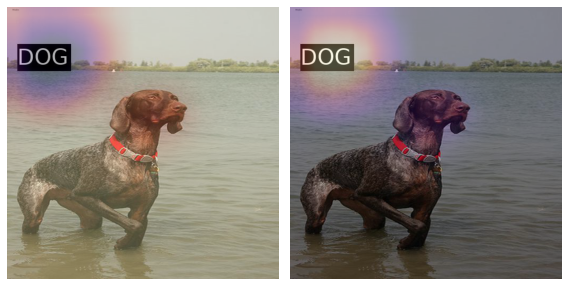

In [24]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
#
dls.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

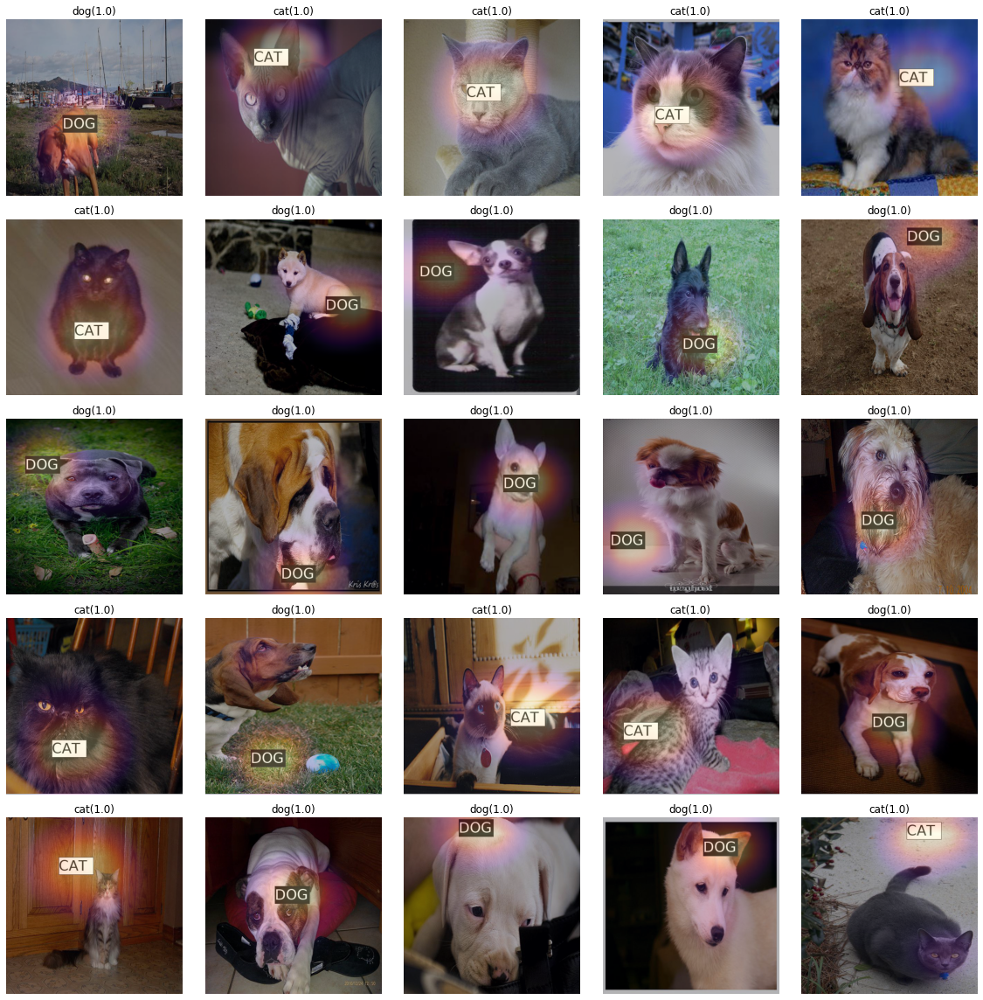

In [25]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())
        a,b = net(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[0].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[1].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

---

### - 여기서는 `랜덤박스를 마스킹한 개/고양이 그림`에 대해 CAM을 진행한 결과를 확인함

#### (1) 랜덤박스가 마스킹 된 개 고양이 그림 

In [26]:
path_res=Path('1103_pet_mode1_res')

In [27]:
path_res.ls()

(#6781) [Path('1103_pet_mode1_res/boxer_128.jpg'),Path('1103_pet_mode1_res/Sphynx_142.jpg'),Path('1103_pet_mode1_res/British_Shorthair_203.jpg'),Path('1103_pet_mode1_res/Ragdoll_142.jpg'),Path('1103_pet_mode1_res/Persian_272.jpg'),Path('1103_pet_mode1_res/Bombay_200.jpg'),Path('1103_pet_mode1_res/shiba_inu_103.jpg'),Path('1103_pet_mode1_res/chihuahua_142.jpg'),Path('1103_pet_mode1_res/scottish_terrier_156.jpg'),Path('1103_pet_mode1_res/basset_hound_163.jpg')...]

In [28]:
files=get_image_files(path_res)

In [29]:
dls=ImageDataLoaders.from_name_func(path_res,files,label_func,item_tfms=Resize(512)) 

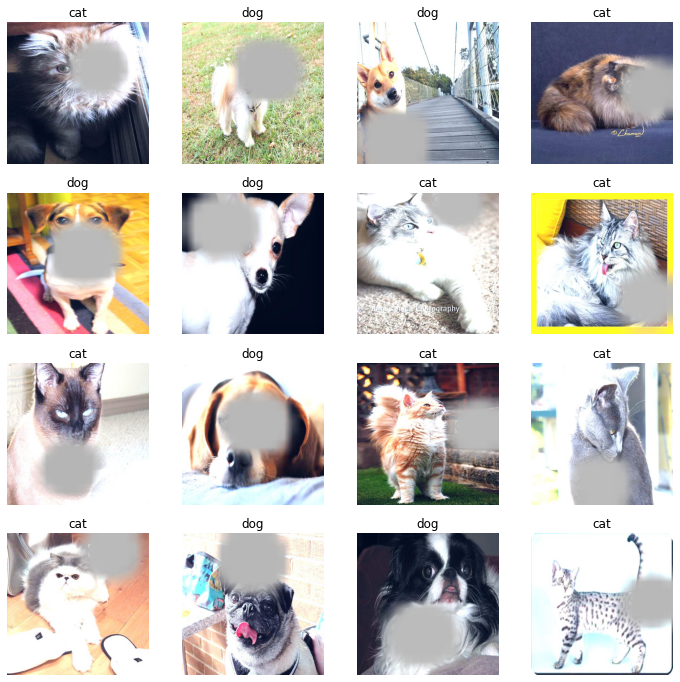

In [30]:
dls.show_batch(max_n=16)

#### (2) CAM 결과

In [31]:
net1
net2

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

#### (2-1) CAM 결과_1개 sample

In [32]:
x, = first(dls.test_dl([PILImage.create(get_image_files(path_res)[4])]))

In [33]:
camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())

In [34]:
x.shape

torch.Size([1, 3, 512, 512])

In [35]:
camimg.shape

torch.Size([2, 16, 16])

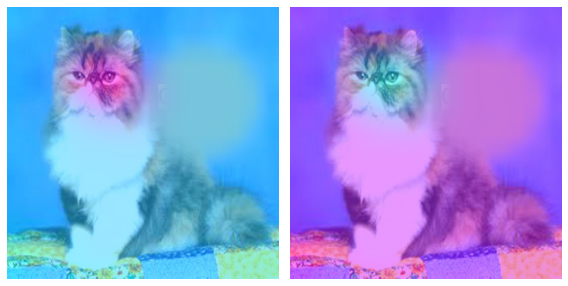

In [36]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
#
dls.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.5,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

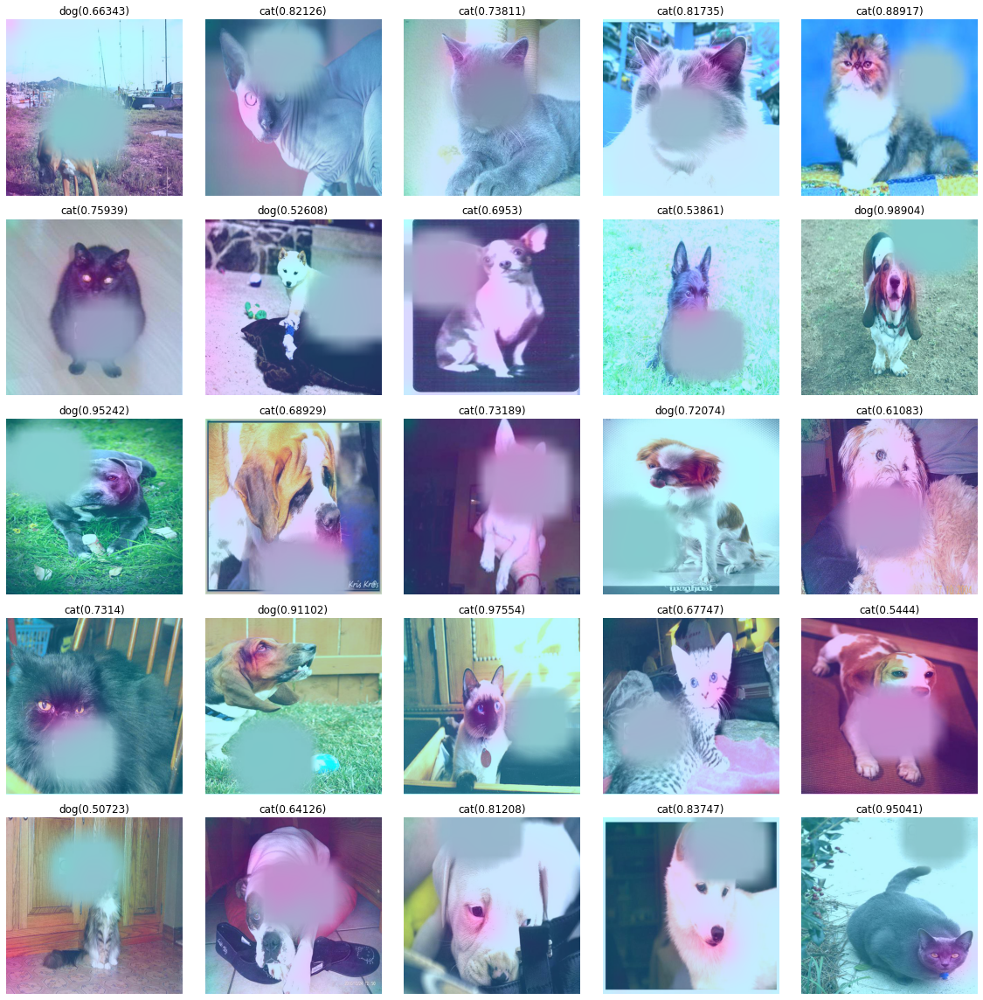

In [39]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path_res)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())
        a,b = net(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[0].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[1].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

### - 여기서는 `랜덤박스를 마스킹한 개/고양이 그림`에 대해 새로이 학습 한 후 CAM을 진행한 결과를 확인함

#### (1) 랜덤박스가 마스킹 된 개 고양이 그림 

In [38]:
dls_r.show_batch(max_n=16)

NameError: name 'dls_r' is not defined

#### (2) 학습

In [40]:
path_res.ls()

(#6781) [Path('1103_pet_mode1_res/boxer_128.jpg'),Path('1103_pet_mode1_res/Sphynx_142.jpg'),Path('1103_pet_mode1_res/British_Shorthair_203.jpg'),Path('1103_pet_mode1_res/Ragdoll_142.jpg'),Path('1103_pet_mode1_res/Persian_272.jpg'),Path('1103_pet_mode1_res/Bombay_200.jpg'),Path('1103_pet_mode1_res/shiba_inu_103.jpg'),Path('1103_pet_mode1_res/chihuahua_142.jpg'),Path('1103_pet_mode1_res/scottish_terrier_156.jpg'),Path('1103_pet_mode1_res/basset_hound_163.jpg')...]

In [41]:
files=get_image_files(path_res)

In [42]:
dls_r=ImageDataLoaders.from_name_func(path_res,files,label_func,item_tfms=Resize(512)) 

In [43]:
lrnr_r1=cnn_learner(dls_r,resnet34,metrics=error_rate)
lrnr_r1.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.277847,0.073814,0.028024,00:33


epoch,train_loss,valid_loss,error_rate,time
0,0.036215,0.000641,0.000000,00:41


In [44]:
net_1=lrnr_r1.model[0]
net_2=lrnr_r1.model[1] 

In [45]:
net_2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [46]:
net_r=torch.nn.Sequential(net_1,net_2)

In [47]:
lrnr_r2=Learner(dls_r,net_r,metrics=accuracy) 

In [48]:
lrnr_r2.fine_tune(10) 

epoch,train_loss,valid_loss,accuracy,time
0,0.121854,6.656478,0.347345,00:41


epoch,train_loss,valid_loss,accuracy,time
0,0.035756,0.020925,0.992625,00:41
1,0.020512,51.943291,0.319322,00:41
2,0.029023,0.014849,0.994100,00:41
3,0.009772,0.272296,0.944690,00:41
4,0.010861,0.302868,0.882006,00:41
5,0.009366,0.042339,0.985251,00:41
6,0.005556,0.004416,0.999263,00:41
7,0.002338,0.003293,0.998525,00:41
8,0.000785,0.000986,1.000000,00:41
9,0.000452,0.000754,1.000000,00:41


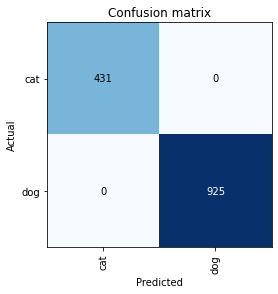

In [49]:
interp = ClassificationInterpretation.from_learner(lrnr_r2)
interp.plot_confusion_matrix()

#### (3) CAM 결과

In [50]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_res)[4])]))

In [51]:
camimg1 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())

In [52]:
x.shape

torch.Size([1, 3, 512, 512])

In [53]:
camimg.shape

torch.Size([2, 16, 16])

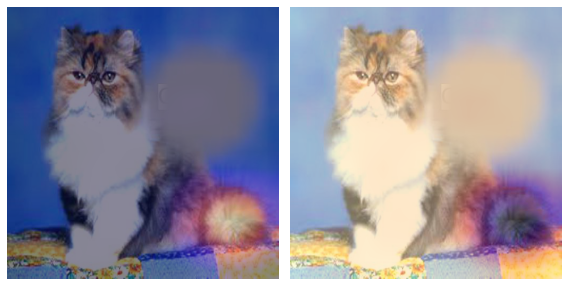

In [54]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.5,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.5,extent=(0,512,512,0),interpolation='bilinear',cmap='magma')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

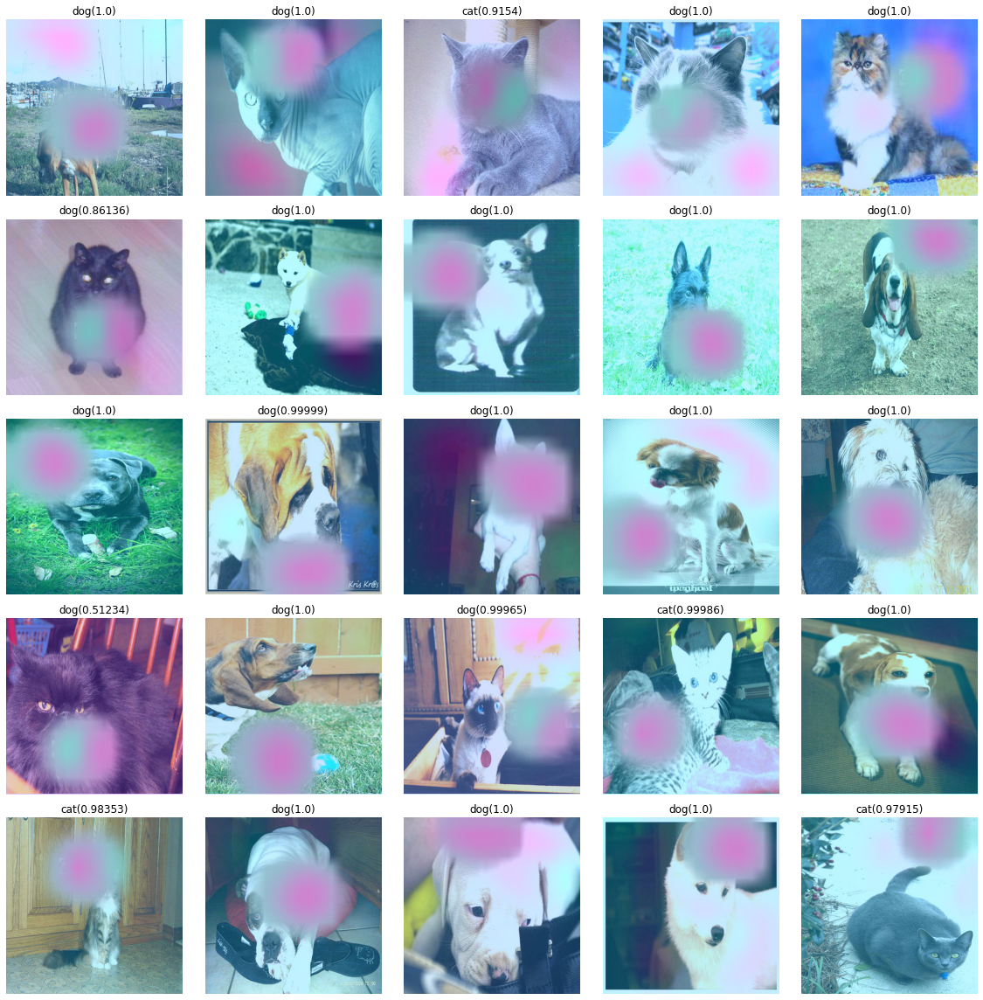

In [55]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path_res)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
        a,b = net_r(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[0].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[1].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

### 아예 단계 합쳐버리기

In [56]:
path=Path('1103_pet')   #랜덤박스넣은사진

In [57]:
path.ls()

(#7391) [Path('1103_pet/boxer_128.jpg'),Path('1103_pet/Sphynx_142.jpg'),Path('1103_pet/British_Shorthair_203.jpg'),Path('1103_pet/Ragdoll_142.jpg'),Path('1103_pet/Persian_272.jpg'),Path('1103_pet/Bombay_200.jpg'),Path('1103_pet/shiba_inu_103.jpg'),Path('1103_pet/chihuahua_142.jpg'),Path('1103_pet/scottish_terrier_156.jpg'),Path('1103_pet/basset_hound_163.jpg')...]

In [58]:
files=get_image_files(path)

In [59]:
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

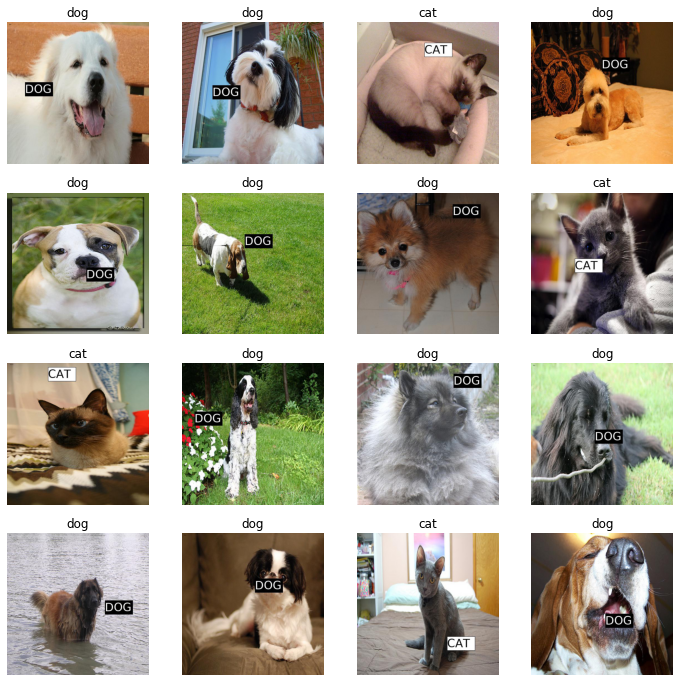

In [60]:
dls.show_batch(max_n=16)

#### (2) 학습 

In [61]:
lrnr=cnn_learner(dls,resnet34,metrics=error_rate)
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.145873,0.015106,0.002706,00:36


epoch,train_loss,valid_loss,error_rate,time
0,0.003758,0.000044,0.000000,00:44


In [62]:
net1=lrnr.model[0]
net2=lrnr.model[1] 

In [63]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [64]:
net=torch.nn.Sequential(net1,net2)

In [65]:
lrnr2=Learner(dls,net,metrics=accuracy) 

In [66]:
lrnr2.fine_tune(10) 

epoch,train_loss,valid_loss,accuracy,time
0,0.008627,0.000188,1.000000,00:44


epoch,train_loss,valid_loss,accuracy,time
0,0.000015,0.000003,1.000000,00:44
1,0.000005,0.000002,1.000000,00:44
2,0.000001,0.000000,1.000000,00:44
3,0.000000,0.000000,1.000000,00:44
4,0.000000,0.000000,1.000000,00:44
5,0.000000,0.000000,1.000000,00:44
6,0.000000,0.000000,1.000000,00:44
7,0.000000,0.000000,1.000000,00:44
8,0.000000,0.000000,1.000000,00:44
9,0.000000,0.000000,1.000000,00:44


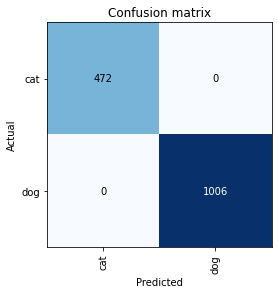

In [67]:
interp = ClassificationInterpretation.from_learner(lrnr2)
interp.plot_confusion_matrix()

#### (3) CAM 결과

In [68]:
x, = first(dls.test_dl([PILImage.create(get_image_files(path)[4])]))

In [69]:
camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())

In [70]:
x.shape

torch.Size([1, 3, 512, 512])

In [71]:
camimg.shape

torch.Size([2, 16, 16])

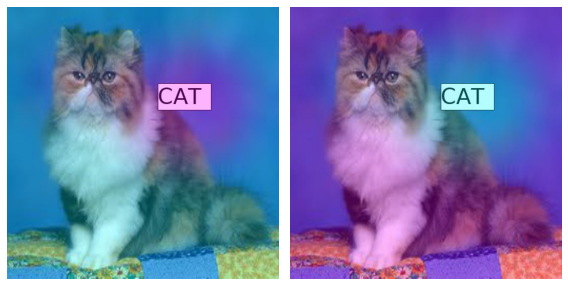

In [72]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
#
dls.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


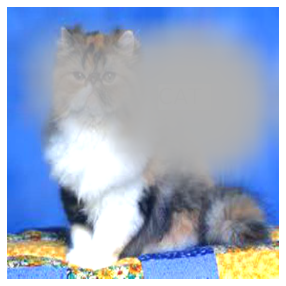

In [73]:
x, = first(dls.test_dl([PILImage.create(get_image_files(path)[4])]))
camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())
a,b = net(x).tolist()[0]
catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
if catprob>dogprob: 
    test=camimg[0]-torch.min(camimg[0])
    A1=torch.exp(-0.1*test)
    X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
    Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
    x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
    (x1*0.35).squeeze().show()
else: 
        test=camimg[1]-torch.min(camimg[1])
        A1=torch.exp(-0.1*test)
        X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
        Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
        x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
        (x1*0.35).squeeze().show()

In [74]:
x1=x1.reshape(1,3,512,512)

In [75]:
net1.to('cpu')
net2.to('cpu')

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [76]:
camimg1 = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x1).squeeze())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


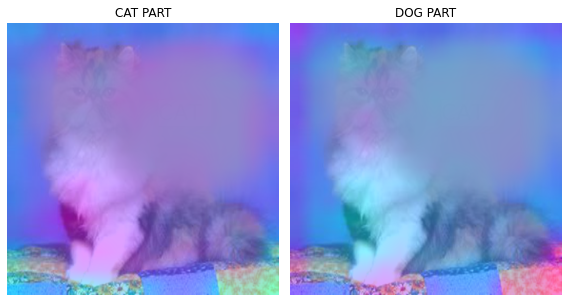

In [77]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
(x1*0.3).squeeze().show(ax=ax1)
ax1.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax1.set_title("CAT PART")
#
(x1*0.3).squeeze().show(ax=ax2)
ax2.imshow(camimg1[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='cool')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()